# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 26.03.2025

Мягкий дедлайн: 13.04.2025 23:59 MSK

Жёсткий дедлайн: 17.04.2025 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.



In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

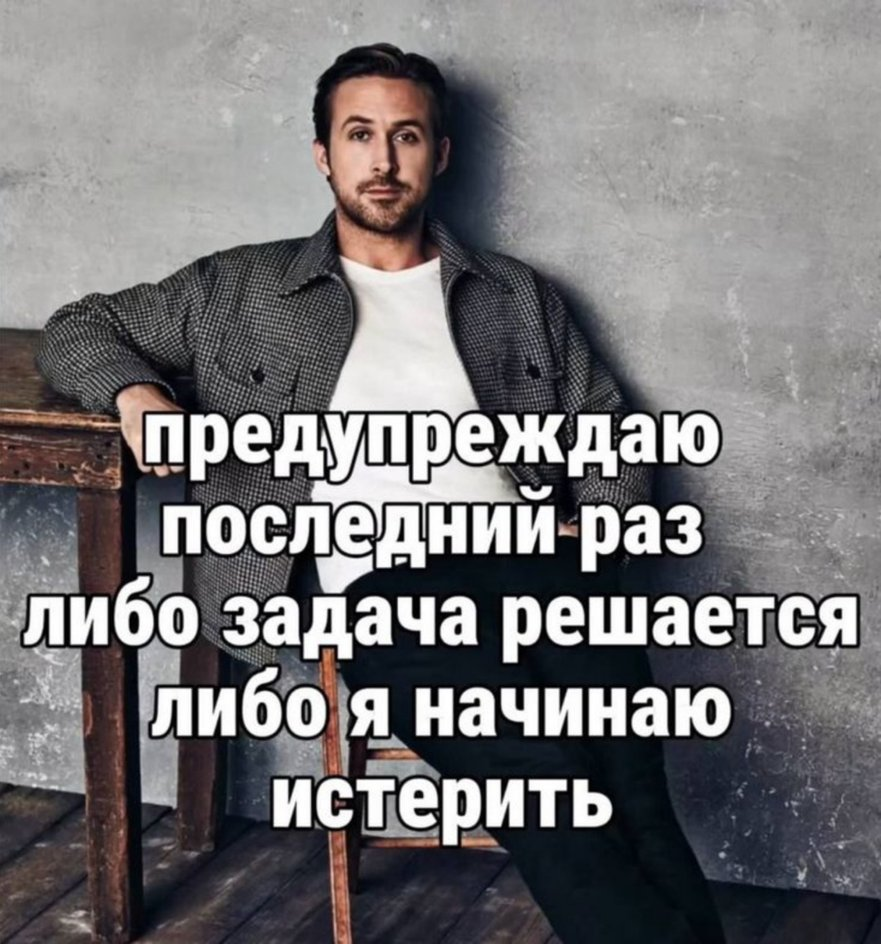

In [2]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [3]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

        D = np.diag(np.sum(X, axis=1))

        L = D - X

        nums, vecs = np.linalg.eigh(L)
        # print(nums)
        # print(vecs)

        return vecs[:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [4]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Альтернативная ссылка: [отсюда](https://disk.yandex.ru/i/J0HlcDXd_KyIeg). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [5]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [6]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [7]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    routes = {}
    for index, row in data.iterrows():
        for route in str(row['RouteNumbers_en']).split(';'):
            route = route.strip()
            if route not in routes:
                routes[route] = []
            routes[route].append(row.name)
    return routes

def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    sorted_routes = {}
    for route, stops in routes.items():
        coordinates = data.loc[stops, ['Latitude_WGS84_en', 'Longitude_WGS84_en']].values

        total_distances = []
        for i in range(len(coordinates)):
            distance = 0
            for j in range(len(coordinates)):
                if i != j:
                    distance += np.linalg.norm(coordinates[i] - coordinates[j])
            total_distances.append(distance)

        start = np.argmax(total_distances)

        unvisited = set(range(len(stops)))
        path = [start]
        unvisited.remove(start)
        current = start

        while unvisited:
            next_stop = min(unvisited, key=lambda i: np.linalg.norm(coordinates[current] - coordinates[i]))
            path.append(next_stop)
            unvisited.remove(next_stop)
            current = next_stop

        sorted_routes[route] = [stops[i] for i in path]
    return sorted_routes

def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    matrix_shape = data.shape[0]
    matrix = np.zeros((matrix_shape, matrix_shape), dtype=int)

    for route, stops in sorted_routes.items():
        for i in range(len(stops) - 1):
            a, b = stops[i], stops[i+1]
            matrix[a, b] += 1

            matrix[b, a] += 1

    np.fill_diagonal(matrix, 0)
    return matrix

In [8]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

In [9]:
print(np.unique(adjacency_matrix))

[ 0  1  2  3  4  5  6  7  8  9 11 12]


Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [10]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [11]:
import matplotlib.pyplot as plt

In [12]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    map_of_msk = folium.Map(location=[55.75215, 37.61819], zoom_start=12)

    unique_labels = np.unique(labels)

    colours = plt.cm.get_cmap('tab10', len(unique_labels))

    for id, row in data.iterrows():
        label = labels[id]
        colour = colours(label)
        hex_colour = "#{:02x}{:02x}{:02x}".format(
            int(colour[0] * 255),
            int(colour[1] * 255),
            int(colour[2] * 255)
        )

        folium.CircleMarker(
            location=[row['Latitude_WGS84_en'], row['Longitude_WGS84_en']],
            radius=4,
            color=hex_colour,
            fill=True,
            fill_color=hex_colour,
            fill_opacity = 0.5,
            popup=row['StationName_en']
        ).add_to(map_of_msk)

    return map_of_msk

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации и подберите гиперпараметры так, чтобы кластеры получились осмысленными (нет такого, что все принадлежит одному кластеру или большая часть точек это шум):
- `sklearn.clustering.KMeans` - `n_clusters`
- `sklearn.clustering.DBSCAN` - `eps`
- ваш `SpectralClustering` - `n_clusters` и `n_components`

Для ряда алгоритмов, в частности DBSCAN, подобрать оптимальные параметры может быть ой, как непросто. Чтобы помочь сохранить нервные клетки рекомендуется пользоваться метриками Intrinsic Evaluation для кластеризации. Для каждого алгоритма скорее всего придется брать разные метрики, а может быть оптимизировать сразу несколько.

Ваша задача - выбрать подходящую метрику, можно взять что-то из списка ниже, можно спросить у гугла. Применить GridSearch, `optuna` или `hyperopt` и желательно завернуть отбор параметров в функцию, пригодится далее

1. $
   \text{Calinski-Harabasz Index} \in [0, \inf] = \frac{\sum_{i=1}^k BCSS_i/(k-1)}{\sum_{i=1}^k WCSS_i/(n-k)} = \frac{\sum_{i=1}^k n_i \| \mathbf{c}_i - \mathbf{c} \|^2/(k-1)}{\sum_{i=1}^k \sum_{\mathbf{x} \in C_i} \|\mathbf{x} - \mathbf{c}_i\|^2/(n-k)} \rightarrow max
   $
   - Отношение 1) расстояния от центра кластера до центра всех данных к 2) расстоянию от центра кластера до точки
   - Чем однороднее и дальше друг от друга кластеры, тем лучше
2. $
   \text{Silhouette Score} \in [0, 1] = \sum_i \frac{b_i - a_i}{\max(a_i, b_i)} \rightarrow max
   $
   - $a_i$ - среднее расстояние до точек внутри своего кластера
   - $b_i$ - среднее расстояние до точек из ближайшего кластера
   - Если в своем кластере точки близко - кластер плотный, идеальный вариант, скор равен 1, если свой кластер совпадает с соседним - кластеры неразделимы, скор равен нулю
   - Чем однороднее и разделимее кластеры, тем лучше
3. $\text{Davies-Bouldin Index} \in [0, inf] = \frac{1}{k} \sum_{i=1}^{k} \max_{j \neq i} \left( \frac{WCSS_i + WCSS_j}{d(c_i, c_j)} \right) \rightarrow min $
   - Отношение внутрикластерных расстояний к межкластерному расстоянию между двумя центрами
   - Если кластеры далеко друг от друга, но при этом однородные, скор наименьший
3. $\text{Elbow Method}$ - последовательное сравнение $WCSS$ из пункта 1 для разного числа параметров. Если уменьшение меньше определенного порога - останавливаемся, считаем это значение оптимальным

In [13]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 14.5 MB/s eta 0:00:00


In [14]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import optuna

In [15]:
# def clustering_objective():
#     # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

In [16]:
def clustering_objective_kmeans(trial):
    n_clusters = trial.suggest_int("n_clusters", 3, 40)
    model = KMeans(n_clusters = n_clusters, random_state = 52)
    labels = model.fit_predict(X)
    score = calinski_harabasz_score(X, labels)
    return score

In [17]:
X = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']]

In [18]:
study_kmeans = optuna.create_study(direction = "maximize")
study_kmeans.optimize(clustering_objective_kmeans, n_trials = 30)
best_kmeans = KMeans(n_clusters = study_kmeans.best_params["n_clusters"], random_state = 52).fit_predict(X)

draw_clustered_map(data, best_kmeans)

[I 2025-04-13 14:55:15,813] A new study created in memory with name: no-name-c6c1557e-b742-4f48-bc3d-b72ee429e7a6
[I 2025-04-13 14:55:15,841] Trial 0 finished with value: 1435.0175880389656 and parameters: {'n_clusters': 7}. Best is trial 0 with value: 1435.0175880389656.
[I 2025-04-13 14:55:15,911] Trial 1 finished with value: 1665.829582797823 and parameters: {'n_clusters': 40}. Best is trial 1 with value: 1665.829582797823.
[I 2025-04-13 14:55:15,942] Trial 2 finished with value: 1532.0006540984239 and parameters: {'n_clusters': 13}. Best is trial 1 with value: 1665.829582797823.
[I 2025-04-13 14:55:15,969] Trial 3 finished with value: 1304.4494044337193 and parameters: {'n_clusters': 6}. Best is trial 1 with value: 1665.829582797823.
[I 2025-04-13 14:55:16,003] Trial 4 finished with value: 1509.1937290885933 and parameters: {'n_clusters': 24}. Best is trial 1 with value: 1665.829582797823.
[I 2025-04-13 14:55:16,024] Trial 5 finished with value: 1509.1937290885933 and parameters: {

In [19]:
def clustering_objective_dbscan(trial):
    eps = trial.suggest_float("eps", 0.001, 0.5)
    min_samples = trial.suggest_int("min_samples", 5, 50)
    model = DBSCAN(eps=eps, min_samples=min_samples)
    labels = model.fit_predict(X)

    if len(set(labels)) <= 2:
        return -1

    score = calinski_harabasz_score(X, labels)
    return score

In [20]:
study_dbscan = optuna.create_study(direction = "maximize")
study_dbscan.optimize(clustering_objective_dbscan, n_trials = 200)
best_dbscan = DBSCAN(**study_dbscan.best_params).fit_predict(X)

draw_clustered_map(data, best_dbscan)

[I 2025-04-13 14:55:20,635] A new study created in memory with name: no-name-5b01d3c1-c339-417a-8a0b-558a5ae22a54
[I 2025-04-13 14:55:20,703] Trial 0 finished with value: -1.0 and parameters: {'eps': 0.027417491358169243, 'min_samples': 9}. Best is trial 0 with value: -1.0.
[I 2025-04-13 14:55:20,802] Trial 1 finished with value: -1.0 and parameters: {'eps': 0.1957624205872311, 'min_samples': 5}. Best is trial 0 with value: -1.0.
[I 2025-04-13 14:55:20,862] Trial 2 finished with value: -1.0 and parameters: {'eps': 0.2577342729225121, 'min_samples': 40}. Best is trial 0 with value: -1.0.
[I 2025-04-13 14:55:20,927] Trial 3 finished with value: -1.0 and parameters: {'eps': 0.08738129066339649, 'min_samples': 41}. Best is trial 0 with value: -1.0.
[I 2025-04-13 14:55:20,978] Trial 4 finished with value: -1.0 and parameters: {'eps': 0.35364101983567514, 'min_samples': 34}. Best is trial 0 with value: -1.0.
[I 2025-04-13 14:55:21,044] Trial 5 finished with value: -1.0 and parameters: {'eps'

In [27]:
def clustering_objective_spectral(trial):
    n_clusters = trial.suggest_int("n_clusters", 4, 30)
    n_components = trial.suggest_int("n_components", 4, 30)
    model = GraphClustering(n_clusters=n_clusters, n_components=n_components)
    labels = model.fit_predict(X_spect)
    score = calinski_harabasz_score(X_spect, labels)
    return score

In [28]:
X_spect = adjacency_matrix

In [29]:
study_spectral = optuna.create_study(direction = "maximize")
study_spectral.optimize(clustering_objective_spectral, n_trials = 50)
best_spectral = GraphClustering(n_clusters=study_spectral.best_params["n_clusters"], n_components=study_spectral.best_params["n_components"]).fit_predict(X_spect)


[I 2025-04-13 14:59:16,708] A new study created in memory with name: no-name-fdc78d49-c33f-4748-ad5d-96c981847c18
[I 2025-04-13 14:59:20,981] Trial 0 finished with value: 1.4368731374106862 and parameters: {'n_clusters': 30, 'n_components': 22}. Best is trial 0 with value: 1.4368731374106862.
[I 2025-04-13 14:59:22,851] Trial 1 finished with value: 1.7113783517306433 and parameters: {'n_clusters': 14, 'n_components': 17}. Best is trial 1 with value: 1.7113783517306433.
[I 2025-04-13 14:59:24,174] Trial 2 finished with value: 1.5430681585665953 and parameters: {'n_clusters': 23, 'n_components': 27}. Best is trial 1 with value: 1.7113783517306433.
[I 2025-04-13 14:59:26,099] Trial 3 finished with value: 1.5779531505776911 and parameters: {'n_clusters': 15, 'n_components': 30}. Best is trial 1 with value: 1.7113783517306433.
[I 2025-04-13 14:59:28,719] Trial 4 finished with value: 1.756338175976397 and parameters: {'n_clusters': 29, 'n_components': 16}. Best is trial 4 with value: 1.75633

In [30]:
draw_clustered_map(data, best_spectral)

<ipython-input-12-4bfa0b66ed77>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colours = plt.cm.get_cmap('tab10', len(unique_labels))


Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`.

In [25]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Вопрос:** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** Думаю, функцию визуализации кластеров я сделал кривовато, но вроде понятно, где какие кластеры.

В общем, можно заметить, что K-means просто и разбил останоки на геометрические фигуры, и при этом далеко не факт, что их соединяют маршруты автобусов.

DBSCAN пытался ориентироваться на плотность остановок и их принадлежности кластерам, поэтому можно увидеть, что кластеры представляют из себя скорее некие группы, окружённые шумом, нежели какие-то связанные между собой объекты. Кстати, синий цвет это шум, и в этом главный минус данного алгоритма. (Очень многое зависит ещё от инициализации алгоритма, поэтому если будете прогонять код, то результат может не повториться)

Спектральная кластеризация вроде попыталась как-то поделить  остановки на кластеры, но я не уверен, что это было успешно, хотя можно увидеть, что кластеры будто изображают маршруты автобусов.

Я бы сказал, что спектральная кластеризация подходит для данной задачи лучше всего. При этом я считаю, что модель также должна как-то учитывать размеры возможных кластеров или их плотность, потому что в итоге я получил кластеры, построенные по маршрутам из ЮЗАО в СВАО

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [31]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
79,business,080.txt,"Argentina, Venezuela in oil deal",Argentina and Venezuela have extended a food-...
2183,tech,360.txt,Confusion over high-definition TV,Now that a critical mass of people have embra...
1038,politics,143.txt,Malik rejects all-black MP lists,A call for ethnic minority shortlists to boos...
1883,tech,060.txt,Microsoft releases patches,Microsoft has warned PC users to update their...
229,business,230.txt,Yukos drops banks from court bid,Russian oil company Yukos has dropped the thr...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [32]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [33]:
nltk.data.path.append('/content/tokenizers')
nltk.data.path.append('/content/corpora')
nltk.data.path.append('/content/corpora/stopwords')
nltk.data.path.append('/content')

nltk.download('punkt', download_dir='/content/')
nltk.download('wordnet', download_dir='/content/')
nltk.download('stopwords', download_dir='/content/')

nltk.download('punkt_tab', download_dir='/content/')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /content/...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /content/...
[nltk_data] Downloading package stopwords to /content/...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /content/...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [34]:
!unzip /content/corpora/wordnet.zip -d /content/corpora/
# !unzip /content/tokenizers/punkt.zip -d /content/tokenizers/

Archive:  /content/corpora/wordnet.zip
   creating: /content/corpora/wordnet/
  inflating: /content/corpora/wordnet/lexnames  
  inflating: /content/corpora/wordnet/data.verb  
  inflating: /content/corpora/wordnet/index.adv  
  inflating: /content/corpora/wordnet/adv.exc  
  inflating: /content/corpora/wordnet/index.verb  
  inflating: /content/corpora/wordnet/cntlist.rev  
  inflating: /content/corpora/wordnet/data.adj  
  inflating: /content/corpora/wordnet/index.adj  
  inflating: /content/corpora/wordnet/LICENSE  
  inflating: /content/corpora/wordnet/citation.bib  
  inflating: /content/corpora/wordnet/noun.exc  
  inflating: /content/corpora/wordnet/verb.exc  
  inflating: /content/corpora/wordnet/README  
  inflating: /content/corpora/wordnet/index.sense  
  inflating: /content/corpora/wordnet/data.noun  
  inflating: /content/corpora/wordnet/data.adv  
  inflating: /content/corpora/wordnet/index.noun  
  inflating: /content/corpora/wordnet/adj.exc  


In [35]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [36]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [37]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

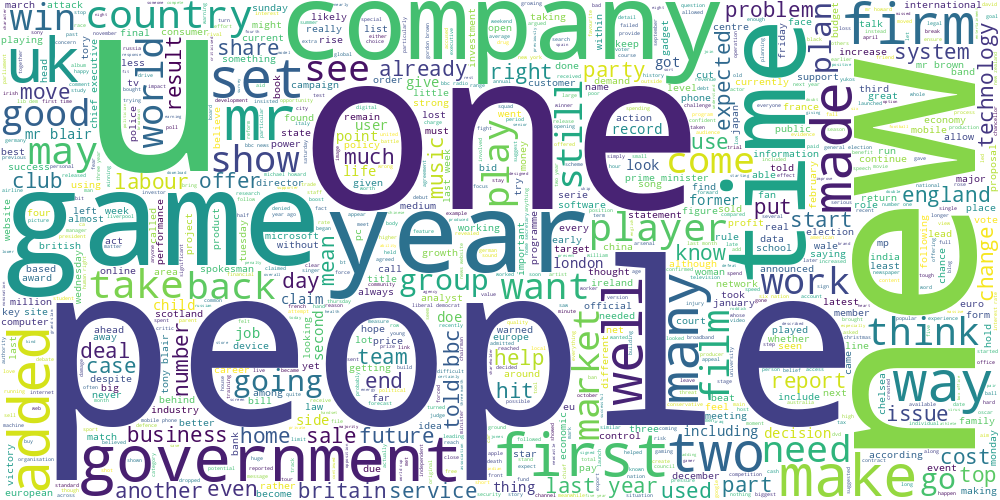

In [38]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров.

In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer

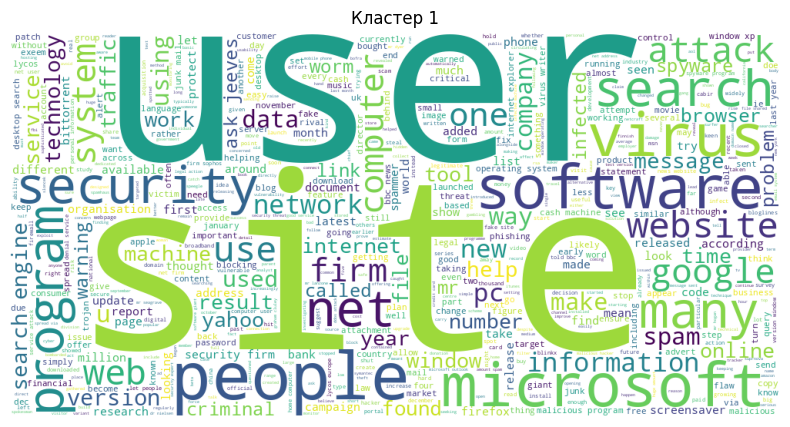

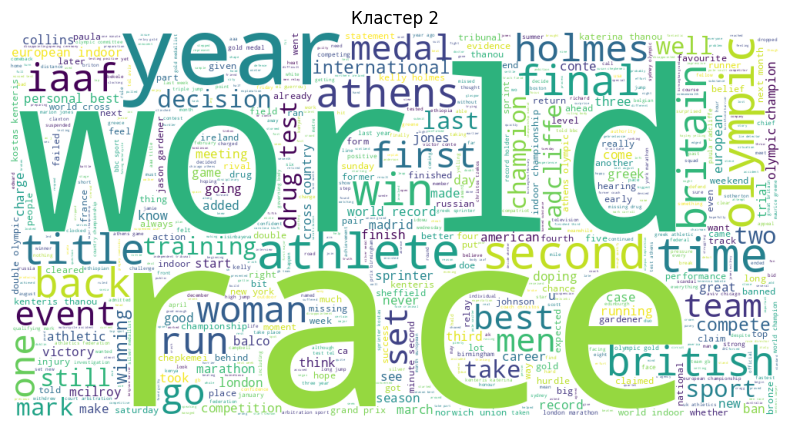

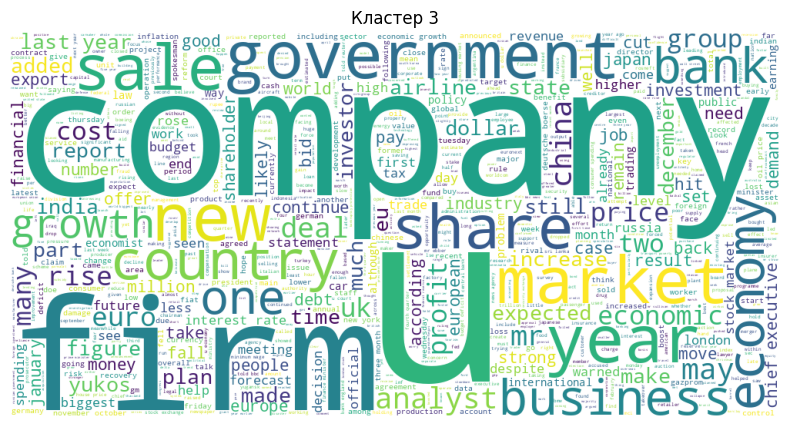

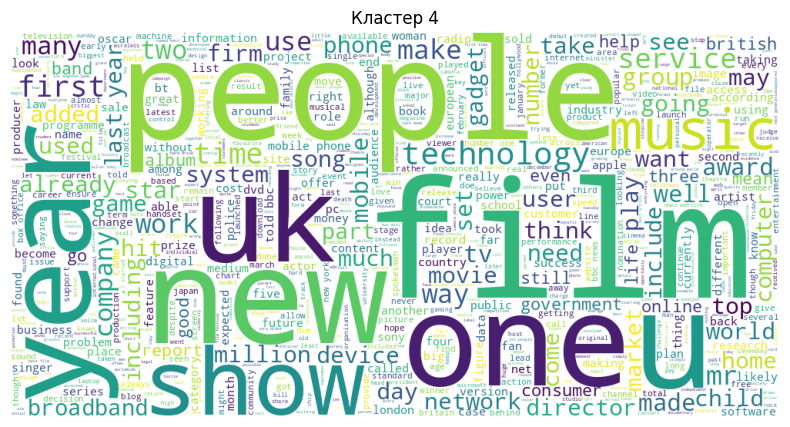

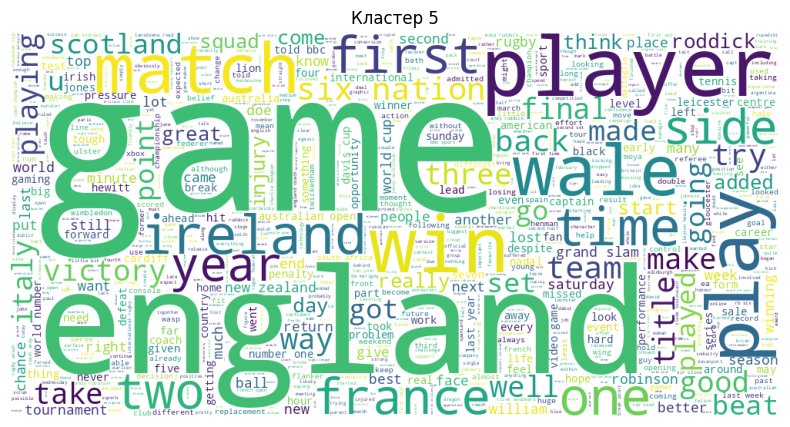

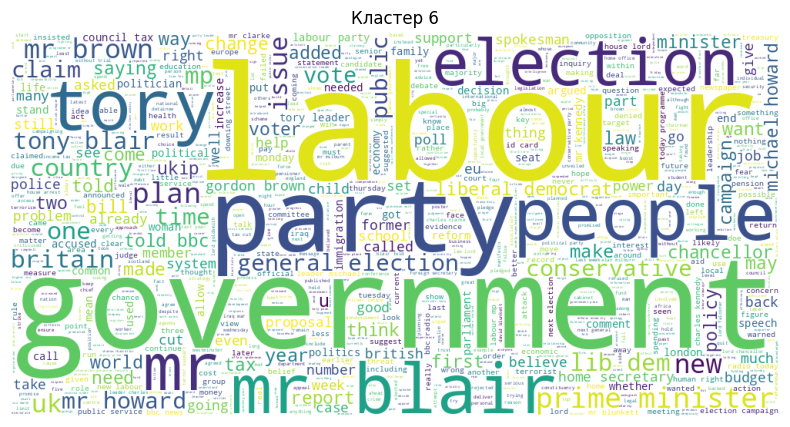

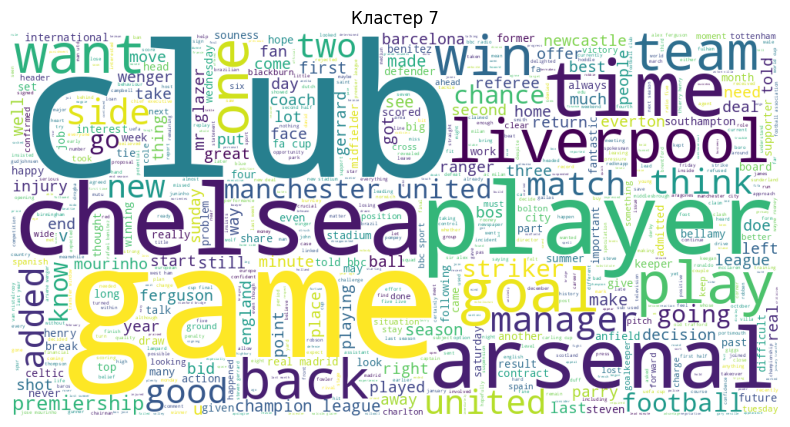

In [40]:
texts = data['text']

vectorizer = TfidfVectorizer(max_df = 0.95, min_df = 3)
X = vectorizer.fit_transform(texts)

kmeans = KMeans(n_clusters = 7, random_state = 52)
labels = kmeans.fit_predict(X)

for num in range(7):
    cluster_texts = [texts[i] for i in range(len(texts)) if labels[i] == num]
    image = draw_wordcloud(cluster_texts)

    plt.figure(figsize=(10, 5))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Кластер {num+1}')
    plt.show()

Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** Это не темы, а конец какой-то просто...

Первая тема: люди, которые используют продукцию майкрософт

Вторая тема: атлет выиграл гонку на олимпиаде

Третья тема: без понятия, что тут происходит

Четвёртая тема: Новый фильм или шоу в Великобритании

Пятая тема: Игра между Англией и Ирландией

Шестая тема: Трудовая вечеринка правительства???

Седьмая тема: Игрок из клуба Челси

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны.

In [41]:
feature_names = vectorizer.get_feature_names_out()
centroids = kmeans.cluster_centers_.argsort()[:, ::-1]

top_words = 7

for num in range(7):
    print(f"Кластер {num+1}:")
    top_feature_names = [feature_names[ind] for ind in centroids[num, :top_words]]
    print("Ключевые слова:", ", ".join(top_feature_names))

Кластер 1:
Ключевые слова: site, virus, microsoft, user, search, software, program
Кластер 2:
Ключевые слова: olympic, race, athens, indoor, world, athletics, athlete
Кластер 3:
Ключевые слова: company, bank, firm, growth, economy, market, year
Кластер 4:
Ключевые слова: film, music, award, people, mobile, show, year
Кластер 5:
Ключевые слова: game, england, player, rugby, match, wale, ireland
Кластер 6:
Ключевые слова: mr, labour, election, party, blair, tory, brown
Кластер 7:
Ключевые слова: club, chelsea, united, arsenal, league, liverpool, game


Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Полученные слова согласуются с облаками тегов

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров (подумайте, как это можно сделать)

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [42]:
from sklearn.cluster import SpectralClustering
from sklearn.manifold import TSNE

In [43]:
n_clusters = 7

kmeans = KMeans(n_clusters = n_clusters, random_state = 52)
kmeans_labels = kmeans.fit_predict(X)

spectral = SpectralClustering(n_clusters = n_clusters, random_state = 52)
spectral_labels = spectral.fit_predict(X.toarray())

In [44]:
dbscan = DBSCAN(eps = 1.28, min_samples = 50)
dbscan_labels = dbscan.fit_predict(X)

In [45]:
tsne = TSNE(n_components = 2, random_state = 52)
X_tsne = tsne.fit_transform(X.toarray())

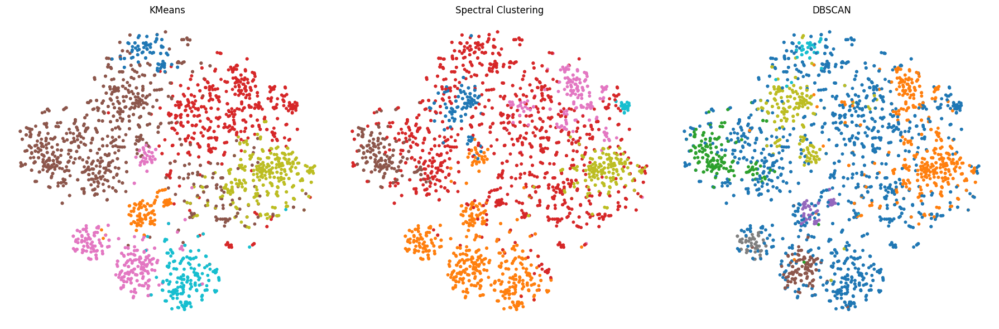

In [46]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

algorithms = [
    ('KMeans', kmeans_labels),
    ('Spectral Clustering', spectral_labels),
    ('DBSCAN', dbscan_labels)
]

for ax, (title, labels) in zip(axes, algorithms):
    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c = labels, cmap = 'tab10', s = 10)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [47]:
pd.DataFrame(kmeans_labels).value_counts()

,count
0,
3,769
2,495
5,314
4,279
6,183
1,97
0,88


In [48]:
pd.DataFrame(spectral_labels).value_counts()

,count
0,
2,1067
1,495
4,188
5,176
3,164
0,113
6,22


In [49]:
pd.DataFrame(dbscan_labels).value_counts()

,count
0,
-1,1226
0,399
5,199
1,164
3,103
4,49
2,48
6,37


Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** В итоге мы получили, что самые сбалансированные кластеры у метода K-means. При этом спектральная кластеризация имеет похожий баланс кластеров, и на графике она выглядит не так уверенно, как K-means. С DBSCAN мне удалось получить 7 кластеров без учёта шума, но баланс кластеров просто улетел вникуда, потому что у нас преобладает шумовой кластер. При этом визуализация разных методов кластеризации для текстов достаточно похожа на то, что получилось с географическими данными.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means.

In [50]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [51]:
def draw_wordcloud_new(idx):
    topic = lda.components_[idx]
    top_words_idx = topic.argsort()[::-1]
    top_words = {vocab[i]: topic[i] for i in top_words_idx}

    wordcloud = WordCloud(background_color="white", width=1000, height=500)
    wordcloud.generate_from_frequencies(top_words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(f"Тема {idx}")
    plt.show()

In [52]:
vectorizer = CountVectorizer(max_df = 0.95, min_df = 3)

X_vect = vectorizer.fit_transform(texts)
vocab = vectorizer.get_feature_names_out()

lda = LatentDirichletAllocation(n_components = 7*2, random_state = 52)
lda.fit(X_vect)

topic_dist = lda.transform(X_vect)
lda_labels = np.argmax(topic_dist, axis=1)

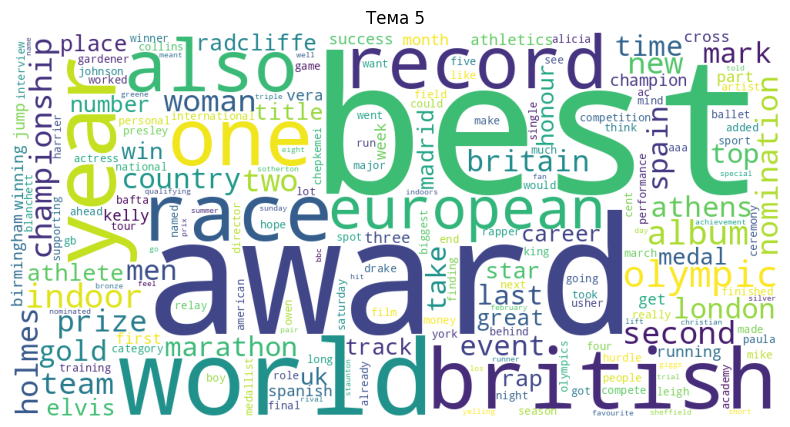

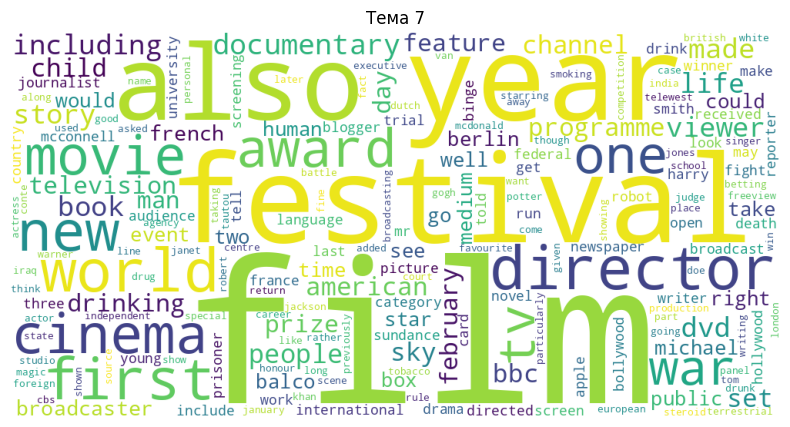

In [53]:
draw_wordcloud_new(5)
draw_wordcloud_new(7)

Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** Темы и правда получились более узкие, так как и слов ключевыъ стало меньше

## Часть 3. Transfer learning и Self-Supervised Learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [54]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [55]:
data['category' + '_encoded'], uniques = pd.factorize(data['category'])
data

,category,filename,title,content,raw_text,text,category_encoded
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,Ad sales boost Time Warner profit Quarterly pr...,ad sale boost time warner profit quarterly pro...,0
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,Dollar gains on Greenspan speech The dollar ha...,dollar gain greenspan speech dollar hit highes...,0
2,business,003.txt,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuk...,Yukos unit buyer faces loan claim The owners o...,yukos unit buyer face loan claim owner embattl...,0
3,business,004.txt,High fuel prices hit BA's profits,British Airways has blamed high fuel prices f...,High fuel prices hit BA's profits British Airw...,high fuel price hit ba profit british airway b...,0
4,business,005.txt,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Dome...,Pernod takeover talk lifts Domecq Shares in UK...,pernod takeover talk lift domecq share uk drin...,0
...,...,...,...,...,...,...,...
2220,tech,397.txt,BT program to beat dialler scams,BT is introducing two initiatives to help bea...,BT program to beat dialler scams BT is introdu...,bt program beat dialler scam bt introducing tw...,4
2221,tech,398.txt,Spam e-mails tempt net shoppers,Computer users across the world continue to i...,Spam e-mails tempt net shoppers Computer users...,spam tempt net shopper computer user across wo...,4
2222,tech,399.txt,Be careful how you code,A new European directive could put software w...,Be careful how you code A new European directi...,careful code new european directive could put ...,4
2223,tech,400.txt,US cyber security chief resigns,The man making sure US computer networks are ...,US cyber security chief resigns The man making...,u cyber security chief resigns man making sure...,4


In [56]:
label_mapping = {label: idx for idx, label in enumerate(uniques)}
label_mapping

{'business': 0, 'entertainment': 1, 'politics': 2, 'sport': 3, 'tech': 4}

In [57]:
X_train, X_test, y_train, y_test = train_test_split(texts, data['category' + '_encoded'], test_size = 0.3, random_state = 52)

In [58]:
tfidf = TfidfVectorizer(max_df = 0.95, min_df = 3)
X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

log_reg_1 = LogisticRegression()
log_reg_1.fit(X_train_tfidf, y_train)

accuracy_train_1 = accuracy_score(y_train, log_reg_1.predict(X_train_tfidf))
accuracy_test_1 = accuracy_score(y_test, log_reg_1.predict(X_test_tfidf))

In [59]:
kmeans = KMeans(n_clusters = 7, random_state = 52)
kmeans.fit(X_train_tfidf)

X_train_tfidf_kmeans = kmeans.transform(X_train_tfidf)
X_test_tfidf_kmeans = kmeans.transform(X_test_tfidf)

log_reg_2 = LogisticRegression()
log_reg_2.fit(X_train_tfidf_kmeans, y_train)

accuracy_train_2 = accuracy_score(y_train, log_reg_2.predict(X_train_tfidf_kmeans))
accuracy_test_2 = accuracy_score(y_test, log_reg_2.predict(X_test_tfidf_kmeans))

In [62]:
vectorizer = CountVectorizer(max_df = 0.95, min_df = 3)
X_train_vect = vectorizer.fit_transform(X_train)
X_test_vect = vectorizer.transform(X_test)

lda = LatentDirichletAllocation(n_components = 14, random_state = 52)
X_train_vect_lda = lda.fit_transform(X_train_vect)
X_test_vect_lda = lda.transform(X_test_vect)

log_reg_3 = LogisticRegression()
log_reg_3.fit(X_train_vect_lda, y_train)

accuracy_train_3 = accuracy_score(y_train, log_reg_3.predict(X_train_vect_lda))
accuracy_test_3 = accuracy_score(y_test, log_reg_3.predict(X_test_vect_lda))

In [63]:
print(f"1. TF-IDF + LogisticRegression train: {accuracy_train_1:.5f}, test: {accuracy_test_1:.5f}")
print(f"2. KMeans + TF-IDF + LogisticRegression train: {accuracy_train_2:.5f}, test: {accuracy_test_2:.5f}")
print(f"3. LDA + LogisticRegression train: {accuracy_train_3:.5f}, test: {accuracy_test_3:.5f}")

1. TF-IDF + LogisticRegression train: 0.99679, test: 0.97455
2. KMeans + TF-IDF + LogisticRegression train: 0.82017, test: 0.80539
3. LDA + LogisticRegression train: 0.91908, test: 0.95359


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Самая лучшая модель получилась TF-IDF + LogisticRegression. Для объяснения результатов скорее проще сказать, почему остальные модели оказались хуже. K-means всё свело к тому, что наши признаки это расстояния до центров кластеров.  При этом с ростом числа кластеров растёт и качество модели. LDA же агрегирует смысл текста в вероятности тем, но, видимо, этого недостаточно для классификации текстов. При этом LDA даже не начала переобучаться, что нельзя сказать об остальных моделях.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [64]:
# 5%/65%/30%
X_train_new, X_validation, y_train_new, y_validation = train_test_split(X_train, y_train, test_size = 0.3, random_state = 52)
X_train_unlabeled, X_train_labeled, _, y_train_labeled = train_test_split(X_train_new, y_train_new, test_size = 5/70, random_state = 52)

In [65]:
tfidf = TfidfVectorizer(max_df = 0.95, min_df = 10)
X_train_new_tfidf = tfidf.fit_transform(X_train_new)
X_train_labeled_tfidf = tfidf.transform(X_train_labeled)
X_validation_tfidf = tfidf.transform(X_validation)
X_test_tfidf = tfidf.transform(X_test)

log_reg_tfidf = LogisticRegression(penalty = None, max_iter=1000)
log_reg_tfidf.fit(X_train_labeled_tfidf, y_train_labeled)

print(f'Accuracy on validation: {accuracy_score(y_validation, log_reg_tfidf.predict(X_validation_tfidf))}')
print(f'Accuracy on test: {accuracy_score(y_test, log_reg_tfidf.predict(X_test_tfidf))}')

Accuracy on validation: 0.8782051282051282
Accuracy on test: 0.8817365269461078


In [66]:
kmeans = KMeans(n_clusters = 40, random_state = 52)
kmeans.fit(X_train_new_tfidf)

X_train_new_cluster = kmeans.transform(X_train_new_tfidf)
X_labeled_cluster = kmeans.transform(X_train_labeled_tfidf)
X_validation_cluster = kmeans.transform(X_validation_tfidf)
X_test_cluster= kmeans.transform(X_test_tfidf)

log_reg_cluster = LogisticRegression(penalty = None, C = 1.0, max_iter=1000)
log_reg_cluster.fit(X_labeled_cluster, y_train_labeled)

print(f'Accuracy on validation: {accuracy_score(y_validation, log_reg_cluster.predict(X_validation_cluster))}')
print(f'Accuracy on test: {accuracy_score(y_test, log_reg_cluster.predict(X_test_cluster))}')

Accuracy on validation: 0.9273504273504274
Accuracy on test: 0.938622754491018


In [67]:
count_vectorizer = CountVectorizer(max_df = 0.95, min_df = 10)
X_train_new_vect = count_vectorizer.fit_transform(X_train_new)
X_train_labeled_vect = count_vectorizer.transform(X_train_labeled)
X_validation_vect = count_vectorizer.transform(X_validation)
X_test_vect = count_vectorizer.transform(X_test)

lda = LatentDirichletAllocation(n_components = 40, random_state = 52)

X_train_new_lda = lda.fit(X_train_new_vect)
X_train_labeled_lda = lda.transform(X_train_labeled_vect)
X_validation_lda = lda.transform(X_validation_vect)
X_test_lda = lda.transform(X_test_vect)

In [68]:
log_reg_lda = LogisticRegression(penalty = 'l2', C = 10, max_iter=1000)
log_reg_lda.fit(X_train_labeled_lda, y_train_labeled)

print(f'Accuracy on validation: {accuracy_score(y_validation, log_reg_lda.predict(X_validation_lda))}')
print(f'Accuracy on test: {accuracy_score(y_test, log_reg_lda.predict(X_test_lda))}')

Accuracy on validation: 0.9230769230769231
Accuracy on test: 0.9416167664670658


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** При подборе гиперпараметров получили зеркальный результат. Модель с LDA показала самое высокое качество. Второй по качесту оказалась модель с K-means. Получается, что при отсутствии нормальной разметки текстов необходимо использовать что-то, что могло бы находить общие черты в текстах.

## Бонус

**Задание 4 (0.5 балла)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [62]:
from sklearn.semi_supervised import LabelPropagation, LabelSpreading
from sklearn.semi_supervised import SelfTrainingClassifier

In [63]:
X_train_semi = pd.concat([X_train_labeled, X_train_unlabeled])
X_train_semi_tfidf = tfidf.fit_transform(X_train_semi)

X_validation_tfidf = tfidf.transform(X_validation)
X_test_tfidf = tfidf.transform(X_test)

In [64]:
y_semi = np.array([-1] * len(X_train_new))
y_semi[:len(y_train_labeled)] = y_train_labeled

In [65]:
def clustering_objective_LabelPropagation(trial):
    n_neighbors = trial.suggest_int("n_neighbors", 2, 40)
    lp = LabelPropagation(kernel='knn', n_neighbors = n_neighbors, max_iter=10000)
    lp.fit(X_train_semi_tfidf, y_semi)

    score = accuracy_score(y_validation, lp.predict(X_validation_tfidf))
    return score

In [66]:
study_LabelPropagation= optuna.create_study(direction = "maximize")
study_LabelPropagation.optimize(clustering_objective_LabelPropagation, n_trials = 100)

[I 2025-04-13 11:26:23,358] A new study created in memory with name: no-name-1f7e05a2-ef60-4b63-ad1c-63a54bb340cd
[I 2025-04-13 11:26:23,570] Trial 0 finished with value: 0.9145299145299145 and parameters: {'n_neighbors': 36}. Best is trial 0 with value: 0.9145299145299145.
[I 2025-04-13 11:26:23,827] Trial 1 finished with value: 0.9017094017094017 and parameters: {'n_neighbors': 12}. Best is trial 0 with value: 0.9145299145299145.
[I 2025-04-13 11:26:24,011] Trial 2 finished with value: 0.9230769230769231 and parameters: {'n_neighbors': 20}. Best is trial 2 with value: 0.9230769230769231.
[I 2025-04-13 11:26:24,279] Trial 3 finished with value: 0.9017094017094017 and parameters: {'n_neighbors': 12}. Best is trial 2 with value: 0.9230769230769231.
[I 2025-04-13 11:26:24,470] Trial 4 finished with value: 0.9081196581196581 and parameters: {'n_neighbors': 39}. Best is trial 2 with value: 0.9230769230769231.
[I 2025-04-13 11:26:24,682] Trial 5 finished with value: 0.9230769230769231 and p

In [67]:
lp = LabelPropagation(kernel='knn', n_neighbors = 14, max_iter=10000)
lp.fit(X_train_semi_tfidf, y_semi)

print(f'Accuracy on validation: {accuracy_score(y_validation, lp.predict(X_validation_tfidf))}')
print(f'Accuracy on test: {accuracy_score(y_test, lp.predict(X_test_tfidf))}')

Accuracy on validation: 0.9316239316239316
Accuracy on test: 0.9311377245508982


In [68]:
def clustering_objective_SelfTrainingClassifier(trial):
    threshold = trial.suggest_float("threshold", 0.1, 0.9)
    log_reg_ = LogisticRegression(penalty = None, max_iter=1000)
    lp = SelfTrainingClassifier(estimator = log_reg_, threshold = threshold)
    lp.fit(X_train_semi_tfidf, y_semi)

    score = accuracy_score(y_validation, lp.predict(X_validation_tfidf))
    return score

In [69]:
study_SelfTrainingClassifier = optuna.create_study(direction = "maximize")
study_SelfTrainingClassifier.optimize(clustering_objective_SelfTrainingClassifier, n_trials = 20)

[I 2025-04-13 11:26:51,050] A new study created in memory with name: no-name-1c22d6f7-43d4-45b7-af8b-fa8b970b810e
[I 2025-04-13 11:26:53,216] Trial 0 finished with value: 0.9230769230769231 and parameters: {'threshold': 0.7754676084279231}. Best is trial 0 with value: 0.9230769230769231.
[I 2025-04-13 11:26:54,520] Trial 1 finished with value: 0.9123931623931624 and parameters: {'threshold': 0.47031796636275425}. Best is trial 0 with value: 0.9230769230769231.
[I 2025-04-13 11:26:57,494] Trial 2 finished with value: 0.9166666666666666 and parameters: {'threshold': 0.7293650408247626}. Best is trial 0 with value: 0.9230769230769231.
[I 2025-04-13 11:27:01,421] Trial 3 finished with value: 0.9145299145299145 and parameters: {'threshold': 0.5722130935211398}. Best is trial 0 with value: 0.9230769230769231.
[I 2025-04-13 11:27:02,702] Trial 4 finished with value: 0.9123931623931624 and parameters: {'threshold': 0.5190753446634191}. Best is trial 0 with value: 0.9230769230769231.
[I 2025-04

In [70]:
log_reg_ = LogisticRegression(penalty = None, max_iter=1000)

self_training_model = SelfTrainingClassifier(log_reg_, threshold = study_SelfTrainingClassifier.best_params["threshold"])
self_training_model.fit(X_train_semi_tfidf, y_semi)

print(f'Accuracy on validation: {accuracy_score(y_validation, self_training_model.predict(X_validation_tfidf))}')
print(f'Accuracy on test: {accuracy_score(y_test, self_training_model.predict(X_test_tfidf))}')

Accuracy on validation: 0.9572649572649573
Accuracy on test: 0.9431137724550899


In [71]:
def clustering_objective_LabelSpreading(trial):
    n_neighbors = trial.suggest_int("n_neighbors", 2, 40)
    lp = LabelSpreading(kernel='knn', n_neighbors = n_neighbors, max_iter=10000)
    lp.fit(X_train_semi_tfidf, y_semi)

    score = accuracy_score(y_validation, lp.predict(X_validation_tfidf))
    return score

In [72]:
study_LabelSpreading = optuna.create_study(direction = "maximize")
study_LabelSpreading.optimize(clustering_objective_LabelSpreading, n_trials = 38)

[I 2025-04-13 11:27:46,568] A new study created in memory with name: no-name-f7dd76fc-3f3c-4ea5-8757-df34baba61ce
[I 2025-04-13 11:27:46,743] Trial 0 finished with value: 0.8846153846153846 and parameters: {'n_neighbors': 14}. Best is trial 0 with value: 0.8846153846153846.
[I 2025-04-13 11:27:46,876] Trial 1 finished with value: 0.8653846153846154 and parameters: {'n_neighbors': 10}. Best is trial 0 with value: 0.8846153846153846.
/usr/local/lib/python3.11/dist-packages/sklearn/semi_supervised/_label_propagation.py:231: RuntimeWarning: invalid value encountered in divide
  probabilities /= normalizer
[I 2025-04-13 11:27:47,016] Trial 2 finished with value: 0.844017094017094 and parameters: {'n_neighbors': 6}. Best is trial 0 with value: 0.8846153846153846.
[I 2025-04-13 11:27:47,158] Trial 3 finished with value: 0.8995726495726496 and parameters: {'n_neighbors': 17}. Best is trial 3 with value: 0.8995726495726496.
[I 2025-04-13 11:27:47,298] Trial 4 finished with value: 0.920940170940

In [73]:
ls = LabelSpreading(kernel='knn', n_neighbors = study_LabelSpreading.best_params["n_neighbors"], max_iter=10000)
ls.fit(X_train_semi_tfidf, y_semi)

print(f'Accuracy on validation: {accuracy_score(y_validation, ls.predict(X_validation_tfidf))}')
print(f'Accuracy on test: {accuracy_score(y_test, ls.predict(X_test_tfidf))}')

Accuracy on validation: 0.9423076923076923
Accuracy on test: 0.9206586826347305


Получилось добиться качества лучше с помощью SelfTrainingClassifier, но LogReg + LDA почти не отстала. В целом все новые модели показали конкурентоспособное качество.

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [74]:
def bcubed(labels, preds):
    '''
    надеюсь, всё верно сделал .____.
    '''
    n = len(labels)

    precisions = []
    recalls = []

    for i in range(n):

        one_cluster = [j for j in range(n) if preds[j] == preds[i]]
        one_class = [j for j in range(n) if labels[j] == labels[i]]

        correctnes = set(one_cluster).intersection(one_class)

        if one_cluster:
            precision = len(correctnes) / len(one_cluster)
        else:
            precision = 0

        if one_class:
            recall = len(correctnes) / len(one_class)
        else:
            recall = 0

        precisions.append(precision)
        recalls.append(recall)

    precision_mean = np.mean(precisions)
    recall_mean = np.mean(recalls)

    f1_score = 2 * precision_mean * recall_mean / (precision_mean + recall_mean)

    return f1_score

In [75]:
print(f"1. TF-IDF + LogisticRegression: {bcubed(np.array(y_test), log_reg_tfidf.predict(X_test_tfidf))}")
print(f"2. KMeans + TF-IDF + LogisticRegression: {bcubed(np.array(y_test), log_reg_cluster.predict(X_test_cluster))}")
print(f"3. LDA + LogisticRegression: {bcubed(np.array(y_test), log_reg_lda.predict(X_test_lda))}")

1. TF-IDF + LogisticRegression: 0.7976082822521445
2. KMeans + TF-IDF + LogisticRegression: 0.8843074850252834
3. LDA + LogisticRegression: 0.8903056796854308


**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***.

In [76]:
!pip install beautifulsoup4 requests bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 69.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [77]:
import os
import random
import requests
from bs4 import BeautifulSoup
import re
import json
from sentence_transformers import SentenceTransformer

from nltk.stem import WordNetLemmatizer
from bertopic import BERTopic
import torch

In [78]:
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words("english"))

In [79]:
def seed_everything(seed):
    # Фискирует максимум сидов.
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True)


seed_everything(52)

In [80]:
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r"[^a-zA-Z0-9 ]+", " ", text)
    words = text.split()
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    return " ".join(words)


def fetch_arxiv_papers(query, year):
    base_url = f"https://export.arxiv.org/api/query?search_query=all:{query}+AND+submittedDate:[{year}01010000+TO+{year}12312359]&start=0&max_results=1000"
    response = requests.get(base_url)
    response.raise_for_status()
    return response.text


def parse_papers(xml_data):
    soup = BeautifulSoup(xml_data, "xml")
    papers = []
    for entry in soup.find_all("entry"):
        title = entry.title.text
        abstract = re.sub(r'\s+', ' ', entry.summary.text.strip())
        abstract = preprocess_text(abstract)
        papers.append({"title": title, "abstract": abstract})
    return papers


def save_papers(papers, filename):
    with open(filename, "w", encoding="utf-8") as file:
        json.dump(papers, file, ensure_ascii=False, indent=4)

In [103]:
seed_everything(18)

xml_data = fetch_arxiv_papers("video generation", 2024)
papers = parse_papers(xml_data)
save_papers(papers, "video_generation_papers_2024.json")
print(f"Saved {len(papers)} papers")

Saved 400 papers


In [104]:
seed_everything(18)
abstracts = [paper["abstract"] for paper in papers]
model = SentenceTransformer("all-MiniLM-L6-v2")

topic_model = BERTopic(embedding_model=model)
topics, _ = topic_model.fit_transform(abstracts)
topic_info = topic_model.get_topic_info()

topic_dict = {}
for index, row in topic_info.iterrows():
    topic_name = f"Topic {row['Topic']}"
    topic_keywords = row['Name']
    topic_dict[topic_name] = topic_keywords

topics = topic_dict
for topic, keywords in topics.items():

    print(f"{topic}: {(keywords)}")

Topic -1: -1_video_generation_model_quality
Topic 0: 0_video_model_understanding_task
Topic 1: 1_video_motion_editing_camera
Topic 2: 2_diffusion_model_video_frame
Topic 3: 3_video_generated_detection_privacy
Topic 4: 4_audio_music_video_generation
Topic 5: 5_text_t2v_video_generation
Topic 6: 6_video_quality_rate_evaluation
Topic 7: 7_vae_compression_video_latent


In [105]:
seed_everything(18)
topic_model.visualize_topics().show()

Тут, наверное, не совсем то, что просили, но я спарсил с архива 1000 заголовков статей про видеогенерацию и попробовал выявить основные темы этих статей. (Парсер немного кривой, поэтому тут 400 статей) Конечно, результат  не очень, наверное модель предобученную слабую взял, но при этом, я думаю, результат будет лучше, чем с использованием LDA или кластеризации. Да и данные неразмеченные, поэтому сравнить модели было бы очень проблематично.

P.S. так я пытался сделать тестовое на стажировку, но меня всё равно не взяли 😭

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку, в музей, театр, или наконец в церковь, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

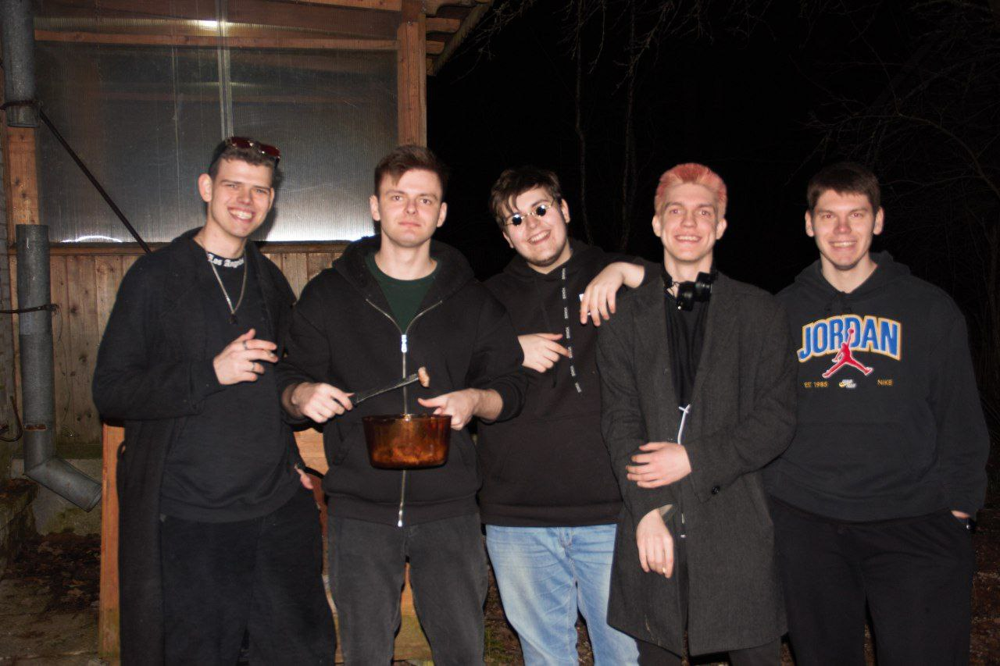

Нет фотопруфов из города, но в общем дело было так. Позвал нас друг погулять по прекрасному городу Сергиев Посад. Город оказался не прям большой, но там находится огромная крепость (Свято-Троицкая Сергиева Лавра), в которой сосредоточены несколько очень красивых церквей. После прогулки по главной достопримечательности города мы поехали к другу на дачу с ночёвкой. Собственно, фотография была сделана после трёх попыток пожарить мясо ночью (в итоге мы его передержали). Но в целом мне всё понравилось 👍

In [ ]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻